# Finding Where to Thrive - Part V
## Comparative Analysis

In this notebook, we will combine our FMR, Wage, CPI and Population data and perform comparative analysis.

We will look to answer the following questions:

1. Have the percentage increases in median wages kept up with the percentage increases in rent and CPI?

2. Is there a correlation between wages and other variables like rent, CPI, and population?

3. Can we conclude that an increase in an area's population directly relates to an increase in living expenses based on our collected data?

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
import fuzzywuzzy
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
from patsy.builtins import *

plt.style.use('bmh')
pd.set_option("display.max.columns", None) #change jupyter settings to see all columns
pd.set_option("display.precision", 2) #change jupyter settings to only show two decimal places
pd.set_option('display.float_format', str) # disable scientific notation

### Data Wrangling

In this section we'll merge our four cleaned data sets for the Fair Market Rents, occupational wage statistics, population, and the Consumer Price Index into one dataframe.

First we'll read in our data.

In [3]:
# load cleaned data sets

fmr = pd.read_csv('FWT_FMR_Wide.csv')
wage = pd.read_csv('BLS Wage Data/FWT_Metro_OEWS_Total.csv')
cpi = pd.read_csv('BLS CPI/FWT_CPI_Year.csv')
pop = pd.read_csv('Population Data/FWT_Metro_Pop.csv')

Next we will convert the FMR values from monthly to yearly values, since our other data points all represent a yearly value.

In [4]:
# multiply monthly rent values to yearly values by multiplying by 12
fmr[['studio', 'one_bed', 'two_bed', 'three_bed', 'four_bed']] = fmr[['studio', 'one_bed', 'two_bed', 'three_bed', 'four_bed']].mul(12)

# add column for average FMR for all residence types
fmr['mean_fmr'] = fmr[['studio', 'one_bed', 'two_bed', 'three_bed', 'four_bed']].mean(axis=1)

fmr.head()

,year,state_alpha,county_name,st_county,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr
0,2017,AL,Autauga County,AL-Autauga County,"Montgomery, AL",7044,8184,9864,12648,17100,10968.0
1,2017,AL,Baldwin County,AL-Baldwin County,"Daphne-Fairhope-Foley, AL",9684,10164,11724,17064,19608,13648.8
2,2017,AL,Bibb County,AL-Bibb County,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2
3,2017,AL,Blount County,AL-Blount County,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2
4,2017,AL,Calhoun County,AL-Calhoun County,"Anniston-Oxford-Jacksonville, AL",5244,5688,7560,9816,11016,7864.8


Since there is a slight difference in some of the metro names between the fmr and wage dataframes (ie Twin Falls, ID' vs 'Twin Falls County, ID) we will use fuzzywuzzy to match and replace the metro_names from the wage dataframe with the metro_names from the fmr dataframe. We already mapped the fmr metro_names to our populaion dataframe in Part IV or our analysis.

In [5]:
# casting the metro_name column of both dataframes into lists
fmr_names = list(fmr['metro_name'].unique())
wage_names = list(wage['metro_name'].unique())

# defining a function to return the match and similarity score of the fuzz.ratio() scorer. The function will take in a term(name), list of terms(list_names), 
# and a minimum similarity score(min_score) to return the match. 
def match_names(name, list_names, min_score=0):
    max_score = -1
    max_name = ''
    for x in list_names:
        score = fuzz.ratio(name, x)
        if (score > min_score) & (score > max_score):
            max_name = x
            max_score = score
    return (max_name, max_score)

# create a for loop to create a list of tuples with the first value being the name from the wage dataframe (name to replace) and the second value from 
# the fmr dataframe, casting the list of tuples as a dictionary. 
names = []
for x in wage_names:
    match = match_names(x, fmr_names, 50)
    if match[1] >= 50:
        name = (str(x), str(match[0]))
        names.append(name)
name_dict = dict(names)
name_dict

{'Anchorage, AK': 'Anchorage, AK',
 'Fairbanks, AK': 'Fairbanks, AK',
 'Anniston-Oxford-Jacksonville, AL': 'Anniston-Oxford-Jacksonville, AL',
 'Auburn-Opelika, AL': 'Auburn-Opelika, AL',
 'Birmingham-Hoover, AL': 'Birmingham-Hoover, AL',
 'Daphne-Fairhope-Foley, AL': 'Daphne-Fairhope-Foley, AL',
 'Decatur, AL': 'Decatur, AL',
 'Dothan, AL': 'Dothan, AL',
 'Florence-Muscle Shoals, AL': 'Florence-Muscle Shoals, AL',
 'Gadsden, AL': 'Gadsden, AL',
 'Huntsville, AL': 'Huntsville, AL',
 'Mobile, AL': 'Mobile, AL',
 'Montgomery, AL': 'Montgomery, AL',
 'Tuscaloosa, AL': 'Tuscaloosa, AL',
 'Fayetteville-Springdale-Rogers, AR-MO': 'Fayetteville-Springdale-Rogers, AR',
 'Fort Smith, AR-OK': 'Fort Smith, AR-OK',
 'Hot Springs, AR': 'Hot Springs, AR',
 'Jonesboro, AR': 'Jonesboro, AR',
 'Little Rock-North Little Rock-Conway, AR': 'Little Rock-North Little Rock-Conway, AR',
 'Pine Bluff, AR': 'Pine Bluff, AR',
 'Flagstaff, AZ': 'Flagstaff, AZ',
 'Lake Havasu City-Kingman, AZ': 'Lake Havasu City-K

##### 
After adjusting the minimum similarity score, we were able to get the majority of the metro names mapped correctly, although we made manual corrections to a few.

In [6]:
name_dict = {'Anchorage, AK': 'Anchorage, AK',
 'Fairbanks, AK': 'Fairbanks, AK',
 'Anniston-Oxford-Jacksonville, AL': 'Anniston-Oxford-Jacksonville, AL',
 'Auburn-Opelika, AL': 'Auburn-Opelika, AL',
 'Birmingham-Hoover, AL': 'Birmingham-Hoover, AL',
 'Daphne-Fairhope-Foley, AL': 'Daphne-Fairhope-Foley, AL',
 'Decatur, AL': 'Decatur, AL',
 'Dothan, AL': 'Dothan, AL',
 'Florence-Muscle Shoals, AL': 'Florence-Muscle Shoals, AL',
 'Gadsden, AL': 'Gadsden, AL',
 'Huntsville, AL': 'Huntsville, AL',
 'Mobile, AL': 'Mobile, AL',
 'Montgomery, AL': 'Montgomery, AL',
 'Tuscaloosa, AL': 'Tuscaloosa, AL',
 'Fayetteville-Springdale-Rogers, AR-MO': 'Fayetteville-Springdale-Rogers, AR',
 'Fort Smith, AR-OK': 'Fort Smith, AR-OK',
 'Hot Springs, AR': 'Hot Springs, AR',
 'Jonesboro, AR': 'Jonesboro, AR',
 'Little Rock-North Little Rock-Conway, AR': 'Little Rock-North Little Rock-Conway, AR',
 'Pine Bluff, AR': 'Pine Bluff, AR',
 'Flagstaff, AZ': 'Flagstaff, AZ',
 'Lake Havasu City-Kingman, AZ': 'Lake Havasu City-Kingman, AZ',
 'Phoenix-Mesa-Scottsdale, AZ': 'Phoenix-Mesa-Scottsdale, AZ',
 'Prescott, AZ': 'Prescott, AZ',
 'Sierra Vista-Douglas, AZ': 'Sierra Vista-Douglas, AZ',
 'Tucson, AZ': 'Tucson, AZ',
 'Yuma, AZ': 'Yuma, AZ',
 'Anaheim-Santa Ana-Irvine, CA': 'Santa Ana-Anaheim-Irvine, CA',
 'Bakersfield, CA': 'Bakersfield, CA',
 'Chico, CA': 'Chico, CA',
 'El Centro, CA': 'El Centro, CA',
 'Fresno, CA': 'Fresno, CA',
 'Hanford-Corcoran, CA': 'Hanford-Corcoran, CA',
 'Los Angeles-Long Beach-Glendale, CA': 'Los Angeles-Long Beach-Glendale, CA',
 'Madera, CA': 'Madera, CA',
 'Merced, CA': 'Merced, CA',
 'Modesto, CA': 'Modesto, CA',
 'Napa, CA': 'Napa, CA',
 'Oakland-Hayward-Berkeley, CA': 'Oakland-Fremont, CA',
 'Oxnard-Thousand Oaks-Ventura, CA': 'Oxnard-Thousand Oaks-Ventura, CA',
 'Redding, CA': 'Redding, CA',
 'Riverside-San Bernardino-Ontario, CA': 'Riverside-San Bernardino-Ontario, CA',
 'Sacramento--Roseville--Arden-Arcade, CA': 'Sacramento-Roseville-Arden-Arcade, CA',
 'Salinas, CA': 'Salinas, CA',
 'San Diego-Carlsbad, CA': 'San Diego-Carlsbad, CA',
 'San Francisco-Redwood City-South San Francisco, CA': 'San Francisco, CA',
 'San Jose-Sunnyvale-Santa Clara, CA': 'San Jose-Sunnyvale-Santa Clara, CA',
 'San Luis Obispo-Paso Robles-Arroyo Grande, CA': 'San Luis Obispo-Paso Robles-Arroyo Grande, CA',
 #'San Rafael, CA': 'Santa Rosa, CA',
 'San Rafael, CA': 'San Rafael, CA',
 'Santa Cruz-Watsonville, CA': 'Santa Cruz-Watsonville, CA',
 'Santa Maria-Santa Barbara, CA': 'Santa Maria-Santa Barbara, CA',
 'Santa Rosa, CA': 'Santa Rosa, CA',
 'Stockton-Lodi, CA': 'Stockton-Lodi, CA',
 'Vallejo-Fairfield, CA': 'Vallejo-Fairfield, CA',
 'Visalia-Porterville, CA': 'Visalia-Porterville, CA',
 'Yuba City, CA': 'Yuba City, CA',
 'Boulder, CO': 'Boulder, CO',
 'Colorado Springs, CO': 'Colorado Springs, CO',
 'Denver-Aurora-Lakewood, CO': 'Denver-Aurora-Lakewood, CO',
 'Fort Collins, CO': 'Fort Collins, CO',
 'Grand Junction, CO': 'Grand Junction, CO',
 'Greeley, CO': 'Greeley, CO',
 'Pueblo, CO': 'Pueblo, CO',
 'Bridgeport-Stamford-Norwalk, CT': 'Stamford-Norwalk, CT',
 'Danbury, CT': 'Danbury, CT',
 'Hartford-West Hartford-East Hartford, CT': 'Hartford-West Hartford-East Hartford, CT',
 'New Haven, CT': 'New Haven-Meriden, CT',
 'Norwich-New London-Westerly, CT-RI': 'Norwich-New London, CT',
 'Waterbury, CT': 'Waterbury, CT',
 'Washington-Arlington-Alexandria, DC-VA-MD-WV': 'Washington-Arlington-Alexandria, DC-VA-MD',
 'Dover, DE': 'Dover, DE',
 #'Wilmington, DE-MD-NJ': 'Wilmington, NC',
 'Wilmington, DE-MD-NJ': 'Wilmington, DE-MD-NJ',
 'Cape Coral-Fort Myers, FL': 'Cape Coral-Fort Myers, FL',
 'Crestview-Fort Walton Beach-Destin, FL': 'Crestview-Fort Walton Beach-Destin, FL',
 'Deltona-Daytona Beach-Ormond Beach, FL': 'Deltona-Daytona Beach-Ormond Beach, FL',
 'Fort Lauderdale-Pompano Beach-Deerfield Beach, FL': 'Fort Lauderdale, FL',
 'Gainesville, FL': 'Gainesville, FL',
 'Homosassa Springs, FL': 'Homosassa Springs, FL',
 'Jacksonville, FL': 'Jacksonville, FL',
 'Lakeland-Winter Haven, FL': 'Lakeland-Winter Haven, FL',
 'Miami-Miami Beach-Kendall, FL': 'Miami-Miami Beach-Kendall, FL',
 'Naples-Immokalee-Marco Island, FL': 'Naples-Immokalee-Marco Island, FL',
 'North Port-Sarasota-Bradenton, FL': 'North Port-Sarasota-Bradenton, FL',
 'Ocala, FL': 'Ocala, FL',
 'Orlando-Kissimmee-Sanford, FL': 'Orlando-Kissimmee-Sanford, FL',
 'Palm Bay-Melbourne-Titusville, FL': 'Palm Bay-Melbourne-Titusville, FL',
 #'Panama City, FL': 'Palm Coast, FL',
 'Panama City, FL': 'Panama City, FL',
 'Pensacola-Ferry Pass-Brent, FL': 'Pensacola-Ferry Pass-Brent, FL',
 'Port St. Lucie, FL': 'Port St. Lucie, FL',
 'Punta Gorda, FL': 'Punta Gorda, FL',
 'Sebastian-Vero Beach, FL': 'Sebastian-Vero Beach, FL',
 'Sebring, FL': 'Sebring, FL',
 'Tallahassee, FL': 'Tallahassee, FL',
 'Tampa-St. Petersburg-Clearwater, FL': 'Tampa-St. Petersburg-Clearwater, FL',
 'The Villages, FL': 'The Villages, FL',
 'West Palm Beach-Boca Raton-Delray Beach, FL': 'West Palm Beach-Boca Raton, FL',
 'Albany, GA': 'Albany, GA',
 'Athens-Clarke County, GA': 'Athens-Clarke County, GA',
 'Atlanta-Sandy Springs-Roswell, GA': 'Atlanta-Sandy Springs-Roswell, GA',
 'Augusta-Richmond County, GA-SC': 'Augusta-Richmond County, GA-SC',
 'Brunswick, GA': 'Brunswick, GA',
 'Columbus, GA-AL': 'Columbus, GA-AL',
 'Dalton, GA': 'Dalton, GA',
 'Gainesville, GA': 'Gainesville, GA',
 'Hinesville, GA': 'Hinesville, GA',
 'Macon, GA': 'Macon, GA',
 'Rome, GA': 'Rome, GA',
 'Savannah, GA': 'Savannah, GA',
 'Valdosta, GA': 'Valdosta, GA',
 'Warner Robins, GA': 'Warner Robins, GA',
 'Kahului-Wailuku-Lahaina, HI': 'Kahului-Wailuku-Lahaina, HI',
 'Urban Honolulu, HI': 'Urban Honolulu, HI',
 'Ames, IA': 'Ames, IA',
 'Cedar Rapids, IA': 'Cedar Rapids, IA',
 'Davenport-Moline-Rock Island, IA-IL': 'Davenport-Moline-Rock Island, IA-IL',
 'Des Moines-West Des Moines, IA': 'Des Moines-West Des Moines, IA',
 'Dubuque, IA': 'Dubuque, IA',
 'Iowa City, IA': 'Iowa City, IA',
 'Sioux City, IA-NE-SD': 'Sioux City, IA-NE-SD',
 'Waterloo-Cedar Falls, IA': 'Waterloo-Cedar Falls, IA',
 'Boise City, ID': 'Boise City, ID',
 "Coeur d'Alene, ID": "Coeur d'Alene, ID",
 'Idaho Falls, ID': 'Idaho Falls, ID',
 'Lewiston, ID-WA': 'Lewiston, ID-WA',
 'Pocatello, ID': 'Pocatello, ID',
 'Bloomington, IL': 'Bloomington, IL',
 #'Carbondale-Marion, IL': 'Canton-Massillon, OH',
 'Carbondale-Marion, IL': 'Carbondale-Marion, IL',
 'Champaign-Urbana, IL': 'Champaign-Urbana, IL',
 'Chicago-Naperville-Arlington Heights, IL': 'Chicago-Joliet-Naperville, IL',
 'Danville, IL': 'Danville, IL',
 'Decatur, IL': 'Decatur, IL',
 #'Elgin, IL': 'Flint, MI',
 'Elgin, IL': 'Elgin, IL',
 'Kankakee, IL': 'Kankakee, IL',
 'Lake County-Kenosha County, IL-WI': 'Kenosha County, WI',
 'Peoria, IL': 'Peoria, IL',
 'Rockford, IL': 'Rockford, IL',
 'Springfield, IL': 'Springfield, IL',
 'Bloomington, IN': 'Bloomington, IN',
 'Columbus, IN': 'Columbus, IN',
 'Elkhart-Goshen, IN': 'Elkhart-Goshen, IN',
 'Evansville, IN-KY': 'Evansville, IN-KY',
 'Fort Wayne, IN': 'Fort Wayne, IN',
 'Gary, IN': 'Gary, IN',
 'Indianapolis-Carmel-Anderson, IN': 'Indianapolis-Carmel, IN',
 'Kokomo, IN': 'Kokomo, IN',
 'Lafayette-West Lafayette, IN': 'Lafayette-West Lafayette, IN',
 'Michigan City-La Porte, IN': 'Michigan City-La Porte, IN',
 'Muncie, IN': 'Muncie, IN',
 'South Bend-Mishawaka, IN-MI': 'South Bend-Mishawaka, IN',
 'Terre Haute, IN': 'Terre Haute, IN',
 'Lawrence, KS': 'Lawrence, KS',
 'Manhattan, KS': 'Manhattan, KS',
 'Topeka, KS': 'Topeka, KS',
 'Wichita, KS': 'Wichita, KS',
 'Bowling Green, KY': 'Bowling Green, KY',
 'Elizabethtown-Fort Knox, KY': 'Elizabethtown, KY',
 'Lexington-Fayette, KY': 'Lexington-Fayette, KY',
 'Louisville/Jefferson County, KY-IN': 'Louisville, KY-IN',
 'Owensboro, KY': 'Owensboro, KY',
 'Alexandria, LA': 'Alexandria, LA',
 'Baton Rouge, LA': 'Baton Rouge, LA',
 'Hammond, LA': 'Hammond, LA',
 'Houma-Thibodaux, LA': 'Houma-Thibodaux, LA',
 'Lafayette, LA': 'Lafayette, LA',
 'Lake Charles, LA': 'Lake Charles, LA',
 'Monroe, LA': 'Monroe, LA',
 'New Orleans-Metairie, LA': 'New Orleans-Metairie, LA',
 'Shreveport-Bossier City, LA': 'Shreveport-Bossier City, LA',
 'Barnstable Town, MA': 'Barnstable Town, MA',
 'Boston-Cambridge-Newton, MA': 'Boston-Cambridge-Quincy, MA-NH',
 #'Brockton-Bridgewater-Easton, MA': 'Allentown-Bethlehem-Easton, PA',
 'Brockton-Bridgewater-Easton, MA': 'Brockton-Bridgewater-Easton, MA',
 #'Framingham, MA': 'Farmington, NM',
 'Framingham, MA': 'Framingham, MA',
 'Lawrence-Methuen Town-Salem, MA-NH': 'Lawrence, MA-NH',
 'Leominster-Gardner, MA': 'Fitchburg-Leominster, MA',
 'New Bedford, MA': 'New Bedford, MA',
 #'Peabody-Salem-Beverly, MA': 'Seattle-Bellevue, WA',
 'Peabody-Salem-Beverly, MA': 'Peabody-Salem-Beverly, MA',
 'Pittsfield, MA': 'Pittsfield, MA',
 'Springfield, MA-CT': 'Springfield, MA',
 'Taunton-Middleborough-Norton, MA': 'Taunton-Mansfield-Norton, MA',
 'Worcester, MA-CT': 'Worcester, MA',
 'Baltimore-Columbia-Towson, MD': 'Baltimore-Columbia-Towson, MD',
 'California-Lexington Park, MD': 'California-Lexington Park, MD',
 'Cumberland, MD-WV': 'Cumberland, MD-WV',
 'Hagerstown-Martinsburg, MD-WV': 'Martinsburg, WV',
 'Salisbury, MD-DE': 'Salisbury, MD',
 'Bangor, ME': 'Bangor, ME',
 'Lewiston-Auburn, ME': 'Lewiston-Auburn, ME',
 'Portland-South Portland, ME': 'Portland, ME',
 'Ann Arbor, MI': 'Ann Arbor, MI',
 'Battle Creek, MI': 'Battle Creek, MI',
 'Bay City, MI': 'Bay City, MI',
 'Detroit-Dearborn-Livonia, MI': 'Detroit-Warren-Livonia, MI',
 'Flint, MI': 'Flint, MI',
 'Grand Rapids-Wyoming, MI': 'Grand Rapids-Wyoming, MI',
 'Jackson, MI': 'Jackson, MI',
 'Kalamazoo-Portage, MI': 'Kalamazoo-Portage, MI',
 'Lansing-East Lansing, MI': 'Lansing-East Lansing, MI',
 'Midland, MI': 'Midland, MI',
 'Monroe, MI': 'Monroe, MI',
 'Muskegon, MI': 'Muskegon, MI',
 'Niles-Benton Harbor, MI': 'Niles-Benton Harbor, MI',
 'Saginaw, MI': 'Saginaw, MI',
 #'Warren-Troy-Farmington Hills, MI': 'Farmington, NM',
 'Warren-Troy-Farmington Hills, MI': 'Warren-Troy-Farmington Hills, MI',
 'Duluth, MN-WI': 'Duluth, MN-WI',
 'Mankato-North Mankato, MN': 'Mankato-North Mankato, MN',
 'Minneapolis-St. Paul-Bloomington, MN-WI': 'Minneapolis-St. Paul-Bloomington, MN-WI',
 'Rochester, MN': 'Rochester, MN',
 'St. Cloud, MN': 'St. Cloud, MN',
 'Cape Girardeau, MO-IL': 'Cape Girardeau, MO-IL',
 'Columbia, MO': 'Columbia, MO',
 'Jefferson City, MO': 'Jefferson City, MO',
 'Joplin, MO': 'Joplin, MO',
 'Kansas City, MO-KS': 'Kansas City, MO-KS',
 'St. Joseph, MO-KS': 'St. Joseph, MO-KS',
 'St. Louis, MO-IL': 'St. Louis, MO-IL',
 'Springfield, MO': 'Springfield, MO',
 'Gulfport-Biloxi-Pascagoula, MS': 'Gulfport-Biloxi, MS',
 'Hattiesburg, MS': 'Hattiesburg, MS',
 'Jackson, MS': 'Jackson, MS',
 'Billings, MT': 'Billings, MT',
 'Great Falls, MT': 'Great Falls, MT',
 'Missoula, MT': 'Missoula, MT',
 'Asheville, NC': 'Asheville, NC',
 'Burlington, NC': 'Burlington, NC',
 'Charlotte-Concord-Gastonia, NC-SC': 'Charlotte-Concord-Gastonia, NC-SC',
 'Durham-Chapel Hill, NC': 'Durham-Chapel Hill, NC',
 'Fayetteville, NC': 'Fayetteville, NC',
 'Goldsboro, NC': 'Goldsboro, NC',
 'Greensboro-High Point, NC': 'Greensboro-High Point, NC',
 'Greenville, NC': 'Greenville, NC',
 'Hickory-Lenoir-Morganton, NC': 'Hickory-Lenoir-Morganton, NC',
 'Jacksonville, NC': 'Jacksonville, NC',
 #'New Bern, NC': 'New Bedford, MA',
 'New Bern, NC': 'New Bern, NC',
 'Raleigh, NC': 'Raleigh, NC',
 'Rocky Mount, NC': 'Rocky Mount, NC',
 'Wilmington, NC': 'Wilmington, NC',
 'Winston-Salem, NC': 'Winston-Salem, NC',
 'Bismarck, ND': 'Bismarck, ND',
 'Fargo, ND-MN': 'Fargo, ND-MN',
 'Grand Forks, ND-MN': 'Grand Forks, ND-MN',
 #'Grand Island, NE': 'Grand Forks, ND-MN',
 'Grand Island, NE': 'Grand Island, NE',
 'Lincoln, NE': 'Lincoln, NE',
 'Omaha-Council Bluffs, NE-IA': 'Omaha-Council Bluffs, NE-IA',
 'Dover-Durham, NH-ME': 'Dover, DE',
 'Manchester, NH': 'Manchester, NH',
 'Nashua, NH-MA': 'Nashua, NH',
 'Portsmouth, NH-ME': 'Portsmouth-Rochester, NH',
 'Atlantic City-Hammonton, NJ': 'Atlantic City-Hammonton, NJ',
 #'Camden, NJ': 'Gadsden, AL',
 'Camden, NJ': 'Camden, NJ',
 'Newark, NJ-PA': 'Newark, NJ',
 'Ocean City, NJ': 'Ocean City, NJ',
 'Trenton, NJ': 'Trenton, NJ',
 'Vineland-Bridgeton, NJ': 'Vineland-Bridgeton, NJ',
 'Albuquerque, NM': 'Albuquerque, NM',
 'Farmington, NM': 'Farmington, NM',
 'Las Cruces, NM': 'Las Cruces, NM',
 'Santa Fe, NM': 'Santa Fe, NM',
 'Carson City, NV': 'Carson City, NV',
 'Las Vegas-Henderson-Paradise, NV': 'Las Vegas-Henderson-Paradise, NV',
 'Reno, NV': 'Reno, NV',
 'Albany-Schenectady-Troy, NY': 'Albany-Schenectady-Troy, NY',
 'Binghamton, NY': 'Binghamton, NY',
 'Buffalo-Cheektowaga-Niagara Falls, NY': 'Buffalo-Cheektowaga-Niagara Falls, NY',
 #'Dutchess County-Putnam County, NY': 'Putnam County, IN',
 'Dutchess County-Putnam County, NY': 'Dutchess County-Putnam County, NY',
 'Elmira, NY': 'Elmira, NY',
 'Glens Falls, NY': 'Glens Falls, NY',
 'Ithaca, NY': 'Ithaca, NY',
 'Kingston, NY': 'Kingston, NY',
 'Nassau County-Suffolk County, NY': 'Nassau-Suffolk, NY',
 'New York-Jersey City-White Plains, NY-NJ': 'Jersey City, NJ',
 'Rochester, NY': 'Rochester, NY',
 'Syracuse, NY': 'Syracuse, NY',
 'Utica-Rome, NY': 'Utica-Rome, NY',
 'Watertown-Fort Drum, NY': 'Watertown-Fort Drum, NY',
 'Akron, OH': 'Akron, OH',
 'Canton-Massillon, OH': 'Canton-Massillon, OH',
 'Cincinnati, OH-KY-IN': 'Cincinnati, OH-KY-IN',
 'Cleveland-Elyria, OH': 'Cleveland-Elyria, OH',
 'Columbus, OH': 'Columbus, OH',
 'Dayton, OH': 'Dayton, OH',
 'Lima, OH': 'Lima, OH',
 'Mansfield, OH': 'Mansfield, OH',
 'Springfield, OH': 'Springfield, OH',
 'Toledo, OH': 'Toledo, OH',
 'Youngstown-Warren-Boardman, OH-PA': 'Youngstown-Warren-Boardman, OH',
 'Enid, OK': 'Enid, OK',
 'Lawton, OK': 'Lawton, OK',
 'Oklahoma City, OK': 'Oklahoma City, OK',
 'Tulsa, OK': 'Tulsa, OK',
 'Albany, OR': 'Albany, OR',
 'Bend-Redmond, OR': 'Bend-Redmond, OR',
 'Corvallis, OR': 'Corvallis, OR',
 'Eugene, OR': 'Eugene-Springfield, OR',
 'Grants Pass, OR': 'Grants Pass, OR',
 'Medford, OR': 'Medford, OR',
 'Portland-Vancouver-Hillsboro, OR-WA': 'Portland-Vancouver-Hillsboro, OR-WA',
 'Salem, OR': 'Salem, OR',
 'Allentown-Bethlehem-Easton, PA-NJ': 'Allentown-Bethlehem-Easton, PA',
 'Altoona, PA': 'Altoona, PA',
 'Bloomsburg-Berwick, PA': 'Harrisburg-Carlisle, PA',
 'Chambersburg-Waynesboro, PA': 'Chambersburg-Waynesboro, PA',
 'East Stroudsburg, PA': 'East Stroudsburg, PA',
 'Erie, PA': 'Erie, PA',
 'Gettysburg, PA': 'Gettysburg, PA',
 'Harrisburg-Carlisle, PA': 'Harrisburg-Carlisle, PA',
 'Johnstown, PA': 'Johnstown, PA',
 'Lancaster, PA': 'Lancaster, PA',
 'Lebanon, PA': 'Lebanon, PA',
 #'Montgomery County-Bucks County-Chester County, PA': 'Western Worcester County, MA',
 'Montgomery County-Bucks County-Chester County, PA': 'Montgomery County-Bucks County-Chester County, PA',
 'Philadelphia, PA': 'Williamsport, PA',
 'Pittsburgh, PA': 'Pittsburgh, PA',
 'Reading, PA': 'Reading, PA',
 'Scranton--Wilkes-Barre--Hazleton, PA': 'Scranton-Wilkes-Barre, PA',
 'State College, PA': 'State College, PA',
 'Williamsport, PA': 'Williamsport, PA',
 'York-Hanover, PA': 'York-Hanover, PA',
 'Providence-Warwick, RI-MA': 'Providence-Fall River, RI-MA',
 'Charleston-North Charleston, SC': 'Charleston-North Charleston, SC',
 'Columbia, SC': 'Columbia, SC',
 'Florence, SC': 'Florence, SC',
 'Greenville-Anderson-Mauldin, SC': 'Greenville-Mauldin-Easley, SC',
 'Myrtle Beach-Conway-North Myrtle Beach, SC-NC': 'Myrtle Beach-North Myrtle Beach-Conway, SC',
 'Spartanburg, SC': 'Spartanburg, SC',
 'Sumter, SC': 'Sumter, SC',
 'Rapid City, SD': 'Rapid City, SD',
 'Sioux Falls, SD': 'Sioux Falls, SD',
 'Chattanooga, TN-GA': 'Chattanooga, TN-GA',
 'Clarksville, TN-KY': 'Clarksville, TN-KY',
 'Cleveland, TN': 'Cleveland, TN',
 'Jackson, TN': 'Jackson, TN',
 'Johnson City, TN': 'Johnson City, TN',
 'Kingsport-Bristol-Bristol, TN-VA': 'Kingsport-Bristol-Bristol, TN-VA',
 'Knoxville, TN': 'Knoxville, TN',
 'Memphis, TN-MS-AR': 'Memphis, TN-MS-AR',
 'Morristown, TN': 'Morristown, TN',
 'Nashville-Davidson--Murfreesboro--Franklin, TN': 'Nashville-Davidson-Murfreesboro-Franklin, TN',
 'Abilene, TX': 'Abilene, TX',
 'Amarillo, TX': 'Amarillo, TX',
 'Austin-Round Rock, TX': 'Austin-Round Rock, TX',
 'Beaumont-Port Arthur, TX': 'Beaumont-Port Arthur, TX',
 'Brownsville-Harlingen, TX': 'Brownsville-Harlingen, TX',
 'College Station-Bryan, TX': 'College Station-Bryan, TX',
 'Corpus Christi, TX': 'Corpus Christi, TX',
 'Dallas-Plano-Irving, TX': 'Dallas, TX',
 'El Paso, TX': 'El Paso, TX',
 'Fort Worth-Arlington, TX': 'Fort Worth-Arlington, TX',
 'Houston-The Woodlands-Sugar Land, TX': 'Houston-The Woodlands-Sugar Land, TX',
 'Killeen-Temple, TX': 'Killeen-Temple, TX',
 'Laredo, TX': 'Laredo, TX',
 'Longview, TX': 'Longview, TX',
 'Lubbock, TX': 'Lubbock, TX',
 'McAllen-Edinburg-Mission, TX': 'McAllen-Edinburg-Mission, TX',
 'Midland, TX': 'Midland, TX',
 'Odessa, TX': 'Odessa, TX',
 'San Angelo, TX': 'San Angelo, TX',
 'San Antonio-New Braunfels, TX': 'San Antonio-New Braunfels, TX',
 'Sherman-Denison, TX': 'Sherman-Denison, TX',
 'Texarkana, TX-AR': 'Texarkana, TX-Texarkana, AR',
 'Tyler, TX': 'Tyler, TX',
 'Victoria, TX': 'Victoria, TX',
 'Waco, TX': 'Waco, TX',
 'Wichita Falls, TX': 'Wichita Falls, TX',
 'Logan, UT-ID': 'Logan, UT-ID',
 'Ogden-Clearfield, UT': 'Ogden-Clearfield, UT',
 'Provo-Orem, UT': 'Provo-Orem, UT',
 'St. George, UT': 'St. George, UT',
 'Salt Lake City, UT': 'Salt Lake City, UT',
 'Blacksburg-Christiansburg-Radford, VA': 'Blacksburg-Christiansburg-Radford, VA',
 'Charlottesville, VA': 'Charlottesville, VA',
 'Harrisonburg, VA': 'Harrisonburg, VA',
 'Lynchburg, VA': 'Lynchburg, VA',
 'Richmond, VA': 'Richmond, VA',
 'Roanoke, VA': 'Roanoke, VA',
 'Staunton-Waynesboro, VA': 'Staunton-Waynesboro, VA',
 'Virginia Beach-Norfolk-Newport News, VA-NC': 'Virginia Beach-Norfolk-Newport News, VA-NC',
 'Winchester, VA-WV': 'Winchester, VA-WV',
 'Burlington-South Burlington, VT': 'Burlington-South Burlington, VT',
 'Bellingham, WA': 'Bellingham, WA',
 'Bremerton-Silverdale, WA': 'Bremerton-Silverdale, WA',
 'Kennewick-Richland, WA': 'Kennewick-Richland, WA',
 'Longview, WA': 'Longview, WA',
 'Mount Vernon-Anacortes, WA': 'Mount Vernon-Anacortes, WA',
 'Olympia-Tumwater, WA': 'Olympia-Tumwater, WA',
 'Seattle-Bellevue-Everett, WA': 'Seattle-Bellevue, WA',
 'Spokane-Spokane Valley, WA': 'Spokane, WA',
 'Tacoma-Lakewood, WA': 'Tacoma, WA',
 'Walla Walla, WA': 'Walla Walla County, WA',
 'Wenatchee, WA': 'Wenatchee, WA',
 'Yakima, WA': 'Yakima, WA',
 'Appleton, WI': 'Appleton, WI',
 'Eau Claire, WI': 'Eau Claire, WI',
 'Fond du Lac, WI': 'Fond du Lac, WI',
 'Green Bay, WI': 'Green Bay, WI',
 'Janesville-Beloit, WI': 'Janesville-Beloit, WI',
 'La Crosse-Onalaska, WI-MN': 'La Crosse-Onalaska, WI-MN',
 'Madison, WI': 'Madison, WI',
 'Milwaukee-Waukesha-West Allis, WI': 'Milwaukee-Waukesha-West Allis, WI',
 'Oshkosh-Neenah, WI': 'Oshkosh-Neenah, WI',
 'Racine, WI': 'Racine, WI',
 'Sheboygan, WI': 'Sheboygan, WI',
 'Wausau, WI': 'Wausau, WI',
 #'Beckley, WV': 'Greeley, CO',
 'Beckley, WV': 'Beckley, WV',
 'Charleston, WV': 'Charleston, WV',
 'Huntington-Ashland, WV-KY-OH': 'Huntington-Ashland, WV-KY-OH',
 'Morgantown, WV': 'Morgantown, WV',
 'Parkersburg-Vienna, WV': 'Parkersburg-Vienna, WV',
 'Weirton-Steubenville, WV-OH': 'Weirton-Steubenville, WV-OH',
 'Wheeling, WV-OH': 'Wheeling, WV-OH',
 'Casper, WY': 'Casper, WY',
 'Cheyenne, WY': 'Cheyenne, WY',
 'Los Angeles-Long Beach-Anaheim, CA': 'Los Angeles-Long Beach-Glendale, CA',
 'San Francisco-Oakland-Hayward, CA': 'San Francisco, CA',
 'Miami-Fort Lauderdale-West Palm Beach, FL': 'Fort Lauderdale, FL',
 'Chicago-Naperville-Elgin, IL-IN-WI': 'Chicago-Joliet-Naperville, IL',
 'Boston-Cambridge-Nashua, MA-NH': 'Boston-Cambridge-Quincy, MA-NH',
 'Detroit-Warren-Dearborn, MI': 'Detroit-Warren-Livonia, MI',
 'New York-Newark-Jersey City, NY-NJ-PA': 'Jersey City, NJ',
 'Philadelphia-Camden-Wilmington, PA-NJ-DE-MD': 'Philadelphia-Camden-Wilmington, PA-NJ-DE-MD',
 'Dallas-Fort Worth-Arlington, TX': 'Fort Worth-Arlington, TX',
 'Seattle-Tacoma-Bellevue, WA': 'Seattle-Bellevue, WA',
 'Twin Falls, ID': 'Twin Falls County, ID'}

#####

In [7]:
# map fmr metro_names to wage dataframe
wage.replace({'metro_name': name_dict},inplace=True)

Now we'll merge the fmr, wage, and population data sets. We will only use the median wage for our analysis.

In [8]:
# merge fmr and wage data, drop duplicate values and unused columns
df = fmr.merge(wage.query("wage_type == 'a_median'"), on=['year','metro_name'])\
     .drop(columns=['county_name', 'st_county', 'occ_title', 'tot_emp', 'wage_type'])\
     .drop_duplicates(keep='first')

In [9]:
df.sample(10)

,year,state_alpha,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr,wage
926,2017,WA,"Spokane, WA",6612,7848,10428,15000,16932,11364.0,37500.0
665,2017,OH,"Canton-Massillon, OH",5808,6912,9132,11664,12588,9220.8,33150.0
3719,2020,VA,"Lynchburg, VA",7560,8112,9852,13272,16068,10972.8,36040.0
4565,2021,TN,"Kingsport-Bristol-Bristol, TN-VA",6156,6396,8412,10992,12096,8810.4,36620.0
2548,2019,NC,"Jacksonville, NC",7956,8004,10116,14628,17772,11695.2,29910.0
13,2017,AL,"Gadsden, AL",6324,6540,8592,10752,12336,8908.8,26760.0
653,2017,NC,"Greensboro-High Point, NC",6936,7860,9156,12300,14736,10197.6,33790.0
1580,2018,NC,"Virginia Beach-Norfolk-Newport News, VA-NC",10884,10944,13140,18396,22944,15261.6,38130.0
2230,2019,IN,"Terre Haute, IN",6204,7644,9660,12480,13572,9912.0,33910.0
2358,2019,ME,"Bangor, ME",8280,9408,11952,14976,20988,13120.8,36370.0


In [10]:
# sum population data by year and metro area
pop = pop.groupby(['year', 'metro_name']).agg('sum').reset_index()

In [11]:
# merge in population data with our dataframe containing fmr and wage data
df = df.merge(pop, on=['year', 'metro_name'])
df

,year,state_alpha,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr,wage,population
0,2017,AL,"Montgomery, AL",7044,8184,9864,12648,17100,10968.0,32560.0,374174
1,2017,AL,"Daphne-Fairhope-Foley, AL",9684,10164,11724,17064,19608,13648.8,28230.0,212521
2,2017,AL,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2,36220.0,1041495
3,2017,AL,"Anniston-Oxford-Jacksonville, AL",5244,5688,7560,9816,11016,7864.8,30760.0,114710
4,2017,AL,"Florence-Muscle Shoals, AL",6348,6384,8076,10764,13092,8932.8,29870.0,147259
...,...,...,...,...,...,...,...,...,...,...,...
2090,2021,WI,"Janesville-Beloit, WI",7812,7872,10368,13812,14064,10785.6,39280.0,164381
2091,2021,WI,"Sheboygan, WI",6420,7728,9228,11820,13764,9792.0,38830.0,117747
2092,2021,WI,"Oshkosh-Neenah, WI",6348,7092,9108,12300,14952,9960.0,46280.0,171623
2093,2021,WY,"Cheyenne, WY",8304,8352,10644,15228,18432,12192.0,43180.0,100863


Next, we'll map each state to its respective CPI region using a mapping document created in Excel and the same abbreviation to state dictionary that we used in Part IV of our analysis.

In [12]:
# read in our CPI region mapping document

cpi_map = pd.read_excel('BLS CPI/BLS Region Mapping.xlsx')
cpi_map.head()

,region,division,states
0,Northeast,New England,Connecticut
1,Northeast,New England,Maine
2,Northeast,New England,Massachusetts
3,Northeast,New England,New Hampshire
4,Northeast,New England,Rhode Island


In [13]:
# create state abbreviation to state name dictionary
abbrev_state = {
            'AL': 'Alabama',
            'AK': 'Alaska',
            'AZ': 'Arizona',
            'AR': 'Arkansas',
            'CA': 'California',
            'CO': 'Colorado',
            'CT': 'Connecticut',
            'DE': 'Delaware',
            'FL': 'Florida',
            'GA': 'Georgia',
            'HI': 'Hawaii',
            'ID': 'Idaho',
            'IL': 'Illinois',
            'IN': 'Indiana',
            'IA': 'Iowa',
            'KS': 'Kansas',
            'KY': 'Kentucky',
            'LA': 'Louisiana',
            'ME': 'Maine',
            'MD': 'Maryland',
            'MA': 'Massachusetts',
            'MI': 'Michigan',
            'MN': 'Minnesota',
            'MS': 'Mississippi',
            'MO': 'Missouri',
            'MT': 'Montana',
            'NE': 'Nebraska',
            'NV': 'Nevada',
            'NH': 'New Hampshire',
            'NJ': 'New Jersey',
            'NM': 'New Mexico',
            'NY': 'New York',
            'NC': 'North Carolina',
            'ND': 'North Dakota',
            'OH': 'Ohio',
            'OK': 'Oklahoma',
            'OR': 'Oregon',
            'PA': 'Pennsylvania',
            'RI': 'Rhode Island',
            'SC': 'South Carolina',
            'SD': 'South Dakota',
            'TN': 'Tennessee',
            'TX': 'Texas',
            'UT': 'Utah',
            'VT': 'Vermont',
            'VA': 'Virginia',
            'WA': 'Washington',
            'WV': 'West Virginia',
            'WI': 'Wisconsin',
            'WY': 'Wyoming',
            'DC': 'District of Columbia',
            }

# create inverse, state name to state abbreviation dictionary

state_abbrev = {v: k for k, v in abbrev_state.items()}

In [14]:
# map state abbreviations from dictionary to create state_alpha column in the CPI mapping

cpi_map['state_alpha'] = cpi_map['states'].map(state_abbrev) 

In [15]:
cpi_map.head(5)

,region,division,states,state_alpha
0,Northeast,New England,Connecticut,CT
1,Northeast,New England,Maine,ME
2,Northeast,New England,Massachusetts,MA
3,Northeast,New England,New Hampshire,NH
4,Northeast,New England,Rhode Island,RI


In [16]:
# create dictionary from cpi_map dataframe

region_map = dict(zip(cpi_map.state_alpha, cpi_map.region))

In [17]:
# create a region column based on state alpha

df['region'] = df['state_alpha'].map(region_map) 

In [18]:
df

,year,state_alpha,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr,wage,population,region
0,2017,AL,"Montgomery, AL",7044,8184,9864,12648,17100,10968.0,32560.0,374174,South
1,2017,AL,"Daphne-Fairhope-Foley, AL",9684,10164,11724,17064,19608,13648.8,28230.0,212521,South
2,2017,AL,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2,36220.0,1041495,South
3,2017,AL,"Anniston-Oxford-Jacksonville, AL",5244,5688,7560,9816,11016,7864.8,30760.0,114710,South
4,2017,AL,"Florence-Muscle Shoals, AL",6348,6384,8076,10764,13092,8932.8,29870.0,147259,South
...,...,...,...,...,...,...,...,...,...,...,...,...
2090,2021,WI,"Janesville-Beloit, WI",7812,7872,10368,13812,14064,10785.6,39280.0,164381,Midwest
2091,2021,WI,"Sheboygan, WI",6420,7728,9228,11820,13764,9792.0,38830.0,117747,Midwest
2092,2021,WI,"Oshkosh-Neenah, WI",6348,7092,9108,12300,14952,9960.0,46280.0,171623,Midwest
2093,2021,WY,"Cheyenne, WY",8304,8352,10644,15228,18432,12192.0,43180.0,100863,West


Now we'll pivot the CPI data, update the column names,
and merge it to the dataframe.

In [19]:
# pivot cpi dataframe to change to long format

cpi = cpi.pivot(index =['region','year'], columns ='category', values ='value')

In [20]:
cpi

category        All items  All items less food and energy  Energy    Food  \
region    year                                                              
Midwest   2017    229.874                          235.77 197.181 240.924   
          2018     234.29                         239.819 208.171 243.376   
          2019    237.776                         244.455 202.478 246.931   
          2020     240.04                         248.399 182.916 253.679   
          2021    252.242                         257.667  226.72 264.268   
Northeast 2017    259.538                         272.177 200.944 255.179   
          2018    265.139                         276.546 218.598  259.98   
          2019    269.392                         282.229 211.672 264.406   
          2020    272.908                         287.062 194.545 273.739   
          2021    283.557                         295.366 231.392 282.975   
South     2017    237.456                         242.638 192.695 249.092   
          2018    242.737                         247.538 204.294 251.827   
          2019    246.265                         252.246  197.87 256.281   
          2020    248.639                         256.024 180.438 264.408   
          2021    261.259                         266.331  218.12 274.003   
West      2017    254.738                         259.322 239.197 254.771   
          2018    263.263                         267.183 264.847 259.259   
          2019     270.35                         274.833 267.778 265.656   
          2020    275.057                         280.401 247.815 277.031   
          2021    287.494                         289.877 298.486 289.762   

category        Shelter  
region    year           
Midwest   2017  262.588  
          2018  270.774  
          2019  279.881  
          2020  286.151  
          2021  294.914  
Northeast 2017  341.302  
          2018  350.021  
          2019  358.529  
          2020  366.379  
          2021  373.245  
South     2017  265.717  
          2018  273.843  
          2019   282.26  
          2020  289.223  
          2021  298.256  
West      2017  317.039  
          2018  330.713  
          2019  345.415  
          2020  355.051  
          2021  363.848

In [21]:
# update cpi column names

cpi = cpi.rename(columns={'All items':'all_items','All items less food and energy':'all_items_less_food_energy', 'Energy':'energy', 'Food':'food', 'Shelter': 'shelter'})
cpi

category        all_items  all_items_less_food_energy  energy    food  shelter
region    year                                                                
Midwest   2017    229.874                      235.77 197.181 240.924  262.588
          2018     234.29                     239.819 208.171 243.376  270.774
          2019    237.776                     244.455 202.478 246.931  279.881
          2020     240.04                     248.399 182.916 253.679  286.151
          2021    252.242                     257.667  226.72 264.268  294.914
Northeast 2017    259.538                     272.177 200.944 255.179  341.302
          2018    265.139                     276.546 218.598  259.98  350.021
          2019    269.392                     282.229 211.672 264.406  358.529
          2020    272.908                     287.062 194.545 273.739  366.379
          2021    283.557                     295.366 231.392 282.975  373.245
South     2017    237.456                     242.638 192.695 249.092  265.717
          2018    242.737                     247.538 204.294 251.827  273.843
          2019    246.265                     252.246  197.87 256.281   282.26
          2020    248.639                     256.024 180.438 264.408  289.223
          2021    261.259                     266.331  218.12 274.003  298.256
West      2017    254.738                     259.322 239.197 254.771  317.039
          2018    263.263                     267.183 264.847 259.259  330.713
          2019     270.35                     274.833 267.778 265.656  345.415
          2020    275.057                     280.401 247.815 277.031  355.051
          2021    287.494                     289.877 298.486 289.762  363.848

In [22]:
# merge cpi data with our df

df = df.merge(cpi, on=['year', 'region'])
df

,year,state_alpha,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr,wage,population,region,all_items,all_items_less_food_energy,energy,food,shelter
0,2017,AL,"Montgomery, AL",7044,8184,9864,12648,17100,10968.0,32560.0,374174,South,237.456,242.638,192.695,249.092,265.717
1,2017,AL,"Daphne-Fairhope-Foley, AL",9684,10164,11724,17064,19608,13648.8,28230.0,212521,South,237.456,242.638,192.695,249.092,265.717
2,2017,AL,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2,36220.0,1041495,South,237.456,242.638,192.695,249.092,265.717
3,2017,AL,"Anniston-Oxford-Jacksonville, AL",5244,5688,7560,9816,11016,7864.8,30760.0,114710,South,237.456,242.638,192.695,249.092,265.717
4,2017,AL,"Florence-Muscle Shoals, AL",6348,6384,8076,10764,13092,8932.8,29870.0,147259,South,237.456,242.638,192.695,249.092,265.717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2090,2021,WI,"Milwaukee-Waukesha-West Allis, WI",7956,9636,11676,14904,16344,12103.2,46910.0,1566487,Midwest,252.242,257.667,226.72,264.268,294.914
2091,2021,WI,"Racine, WI",7176,8256,10884,14340,15672,11265.6,38500.0,196896,Midwest,252.242,257.667,226.72,264.268,294.914
2092,2021,WI,"Janesville-Beloit, WI",7812,7872,10368,13812,14064,10785.6,39280.0,164381,Midwest,252.242,257.667,226.72,264.268,294.914
2093,2021,WI,"Sheboygan, WI",6420,7728,9228,11820,13764,9792.0,38830.0,117747,Midwest,252.242,257.667,226.72,264.268,294.914


In [23]:
# check for null values

df.isna().sum()

year                          0
state_alpha                   0
metro_name                    0
studio                        0
one_bed                       0
two_bed                       0
three_bed                     0
four_bed                      0
mean_fmr                      0
wage                          0
population                    0
region                        0
all_items                     0
all_items_less_food_energy    0
energy                        0
food                          0
shelter                       0
dtype: int64

In [24]:
# check for duplicate rows

df.duplicated().sum()

0

### Exploratory Data Analysis

Now that we have all of our data in one dataframe, we'll complete some multivariate analysis. First we will add a column to the dataframe that gives what percentage of the median wage the median FMR is (the median FMR is represented by the 2-bedroom rent), and another that labels if the precentage is greater than 30%. Remember, the definition of being cost burdened is paying more than 30% of income on housing. 

In [25]:
# create copy of dataframe
df_cb = df.copy()

# add column for median FMR/wage percentage
df_cb['housing_pct'] = df_cb['two_bed']/df_cb['wage']

# add column to identify if housing percentage is greater than 30%
df_cb['cost_burdened'] = df_cb['housing_pct'] > .30

# check head of data
df_cb.head()

,year,state_alpha,metro_name,studio,one_bed,two_bed,three_bed,four_bed,mean_fmr,wage,population,region,all_items,all_items_less_food_energy,energy,food,shelter,housing_pct,cost_burdened
0,2017,AL,"Montgomery, AL",7044,8184,9864,12648,17100,10968.0,32560.0,374174,South,237.456,242.638,192.695,249.092,265.717,0.302948402948403,True
1,2017,AL,"Daphne-Fairhope-Foley, AL",9684,10164,11724,17064,19608,13648.8,28230.0,212521,South,237.456,242.638,192.695,249.092,265.717,0.4153028692879915,True
2,2017,AL,"Birmingham-Hoover, AL",7980,9012,10392,13956,15576,11383.2,36220.0,1041495,South,237.456,242.638,192.695,249.092,265.717,0.28691330756488126,False
3,2017,AL,"Anniston-Oxford-Jacksonville, AL",5244,5688,7560,9816,11016,7864.8,30760.0,114710,South,237.456,242.638,192.695,249.092,265.717,0.24577373211963588,False
4,2017,AL,"Florence-Muscle Shoals, AL",6348,6384,8076,10764,13092,8932.8,29870.0,147259,South,237.456,242.638,192.695,249.092,265.717,0.27037161031134915,False


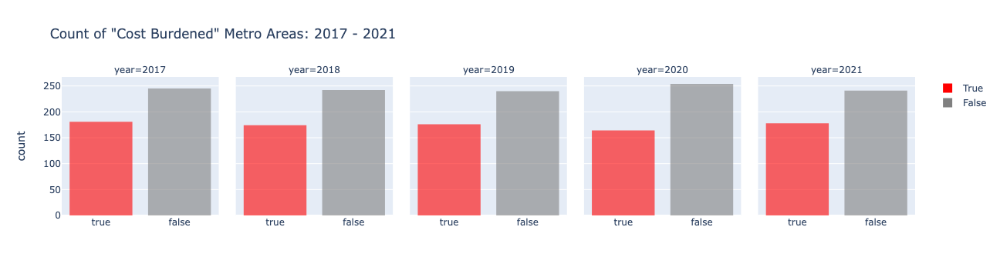

In [26]:
fig = px.histogram(df_cb,
                   x='cost_burdened',
                   facet_col='year',
                   color='cost_burdened',
                   color_discrete_sequence=['red', 'gray'],
                   opacity=0.6,
                   title='Count of "Cost Burdened" Metro Areas: 2017 - 2021',
                   labels={'count':'', 'cost_burdened':''})
fig.show()

We can see that for each year, over a third of the total metro area have a median FMR that exceeds 30% of the median wage. Now we will plot the number of "cost-burdened" metro areas belonging to each state in 2021.

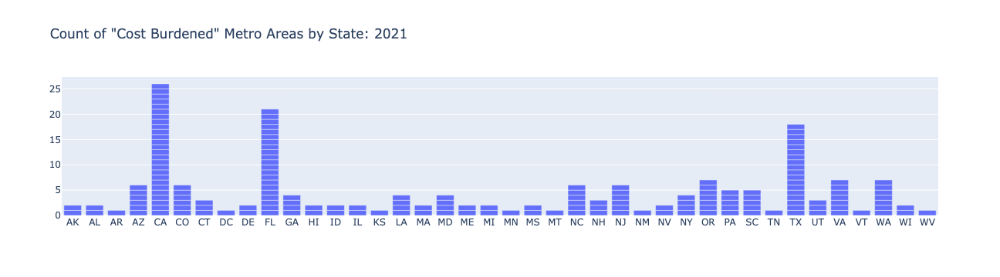

In [27]:
fig = px.bar(df_cb.query("cost_burdened == True & year == 2021")
      .sort_values(by='state_alpha'),
      x='state_alpha',
      hover_data=['metro_name'],
      title='Count of "Cost Burdened" Metro Areas by State: 2021',
      labels={'count':'', 'state_alpha':''})

fig.show()

We can see that California, Florida, and Texas have the most "cost_burdened" metro areas. Let's look at the list of metro areas for each of the three states.

In [28]:
df_cb.query("cost_burdened == True & year == 2021 & state_alpha == 'CA'")[['state_alpha', 'metro_name']].reset_index()

,index,state_alpha,metro_name
0,1857,CA,"Chico, CA"
1,1858,CA,"Sacramento-Roseville-Arden-Arcade, CA"
2,1859,CA,"Fresno, CA"
3,1860,CA,"El Centro, CA"
4,1861,CA,"Bakersfield, CA"
5,1862,CA,"Hanford-Corcoran, CA"
6,1863,CA,"Los Angeles-Long Beach-Glendale, CA"
7,1864,CA,"Madera, CA"
8,1865,CA,"San Francisco, CA"
9,1866,CA,"Merced, CA"


In [29]:
df_cb.query("cost_burdened == True & year == 2021 & state_alpha == 'FL'")[['state_alpha', 'metro_name']].reset_index()

,index,state_alpha,metro_name
0,1709,FL,"Gainesville, FL"
1,1710,FL,"Palm Bay-Melbourne-Titusville, FL"
2,1711,FL,"Fort Lauderdale, FL"
3,1712,FL,"Punta Gorda, FL"
4,1713,FL,"Homosassa Springs, FL"
5,1714,FL,"Jacksonville, FL"
6,1715,FL,"Naples-Immokalee-Marco Island, FL"
7,1716,FL,"Pensacola-Ferry Pass-Brent, FL"
8,1717,FL,"Tallahassee, FL"
9,1718,FL,"Tampa-St. Petersburg-Clearwater, FL"


In [65]:
df_cb.query("cost_burdened == True & year == 2021 & state_alpha == 'TX'")[['state_alpha', 'metro_name']].reset_index()

,index,state_alpha,metro_name
0,1813,TX,"San Antonio-New Braunfels, TX"
1,1814,TX,"Austin-Round Rock, TX"
2,1816,TX,"College Station-Bryan, TX"
3,1817,TX,"Abilene, TX"
4,1818,TX,"Brownsville-Harlingen, TX"
5,1819,TX,"Houston-The Woodlands-Sugar Land, TX"
6,1821,TX,"Odessa, TX"
7,1822,TX,"El Paso, TX"
8,1823,TX,"Victoria, TX"
9,1824,TX,"Sherman-Denison, TX"


Next, we will calculate the 2017 to 2021 percentage changes for each of our values.

In [31]:
# create copy of df, set index as our non-numerical values
df_diff = df.set_index(['year','metro_name', 'state_alpha', 'region']).copy()

# sort values by metro name and year
df_diff = df_diff.sort_values(by=['metro_name', 'year'])

# calcualte percent difference from 2017 to 2021
df_diff = df_diff.groupby('metro_name')\
          .pct_change(periods=4).mul(100)

# drop null rows and year column
df_diff = df_diff[~df_diff.isna().any(axis=1)]\
          .reset_index()\
          .drop(columns='year')

# convert to long format
df_diff = df_diff\
            .melt(id_vars=['state_alpha','metro_name', 'region'],
                  var_name='type',
                  value_name='pct_change') 

df_diff.head(10)

,state_alpha,metro_name,region,type,pct_change
0,TX,"Abilene, TX",South,studio,24.91166077738516
1,OH,"Akron, OH",Midwest,studio,9.689922480620151
2,GA,"Albany, GA",South,studio,7.772020725388606
3,OR,"Albany, OR",West,studio,42.54937163375225
4,NY,"Albany-Schenectady-Troy, NY",Northeast,studio,17.2463768115942
5,NM,"Albuquerque, NM",West,studio,11.49012567324954
6,LA,"Alexandria, LA",South,studio,-9.243697478991598
7,PA,"Allentown-Bethlehem-Easton, PA",Northeast,studio,19.575113808801213
8,PA,"Altoona, PA",Northeast,studio,3.797468354430378
9,TX,"Amarillo, TX",South,studio,19.80952380952381


Now well plot our percentage values for select areas.

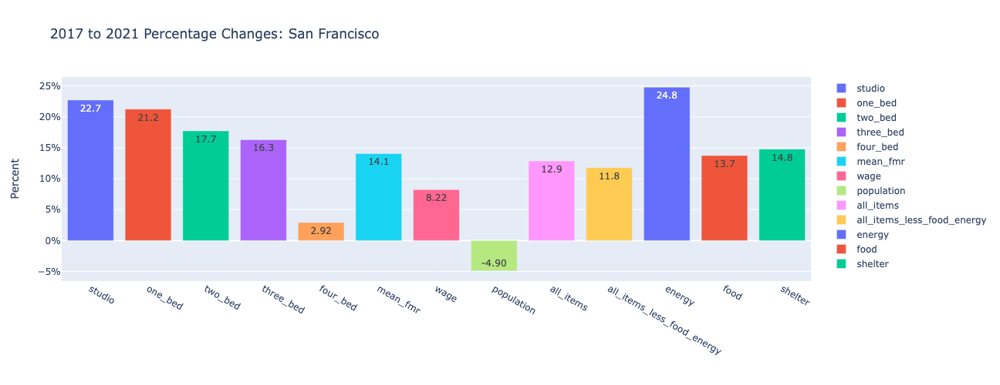

In [32]:
fig = px.bar(df_diff.query("metro_name == 'San Francisco, CA'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: San Francisco',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

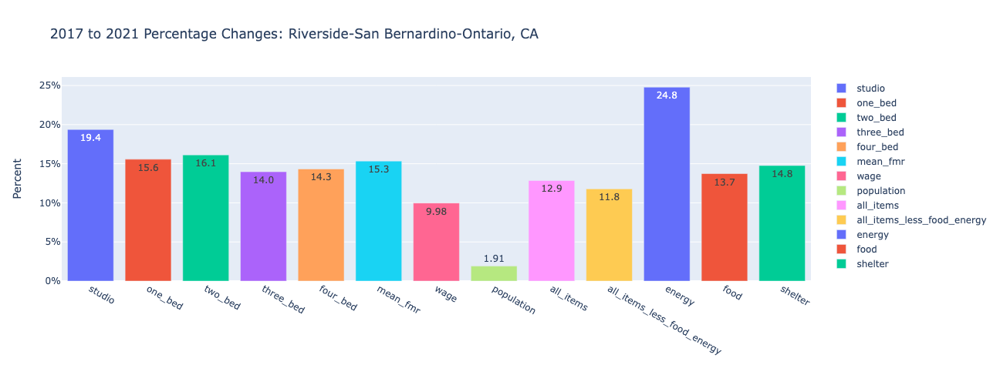

In [33]:
fig = px.bar(df_diff.query("metro_name == 'Riverside-San Bernardino-Ontario, CA'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Riverside-San Bernardino-Ontario, CA',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

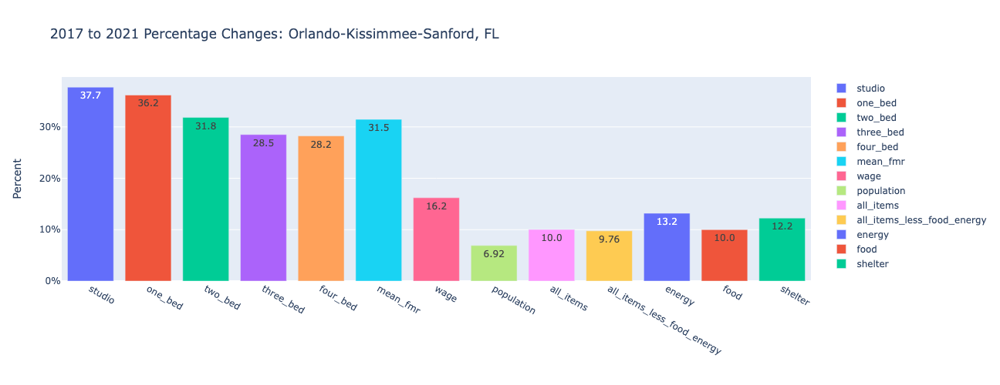

In [34]:
fig = px.bar(df_diff.query("metro_name == 'Orlando-Kissimmee-Sanford, FL'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Orlando-Kissimmee-Sanford, FL',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")


fig.show()

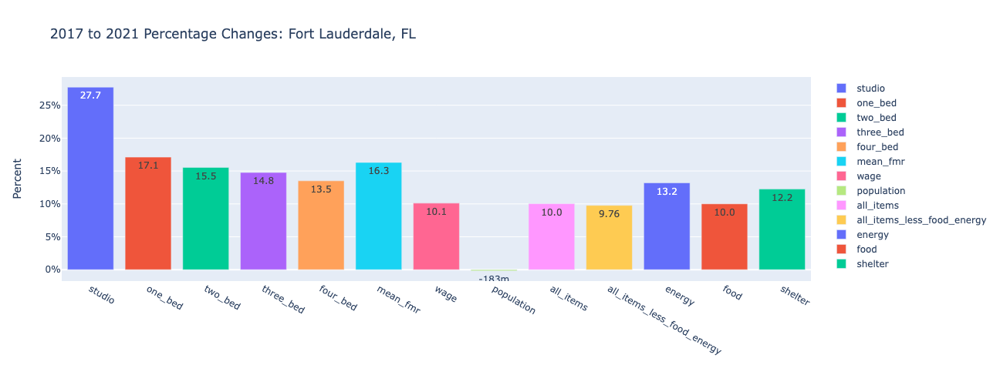

In [35]:
fig = px.bar(df_diff.query("metro_name == 'Fort Lauderdale, FL'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Fort Lauderdale, FL',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

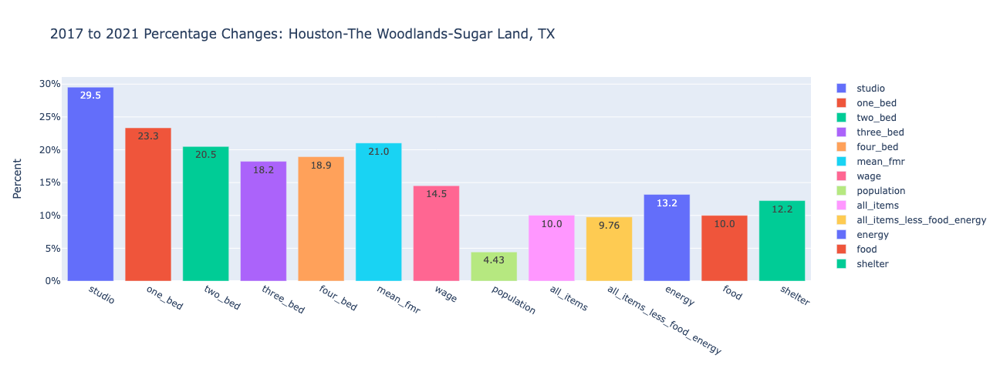

In [36]:
fig = px.bar(df_diff.query("metro_name == 'Houston-The Woodlands-Sugar Land, TX'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Houston-The Woodlands-Sugar Land, TX',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

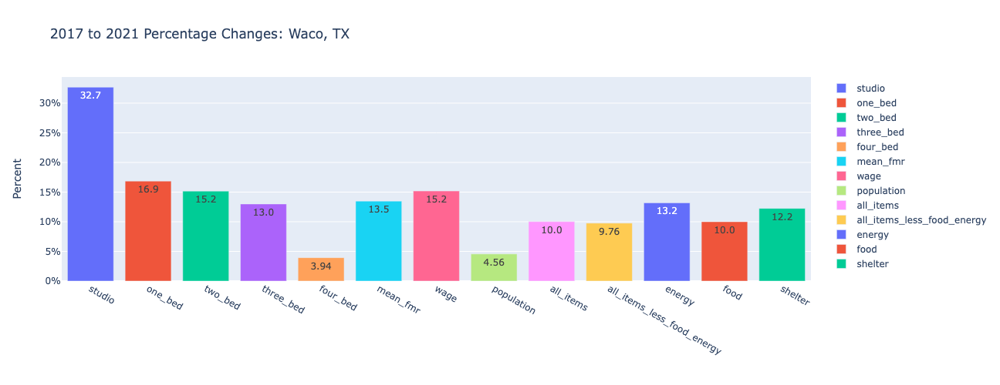

In [37]:
fig = px.bar(df_diff.query("metro_name == 'Waco, TX'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Waco, TX',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

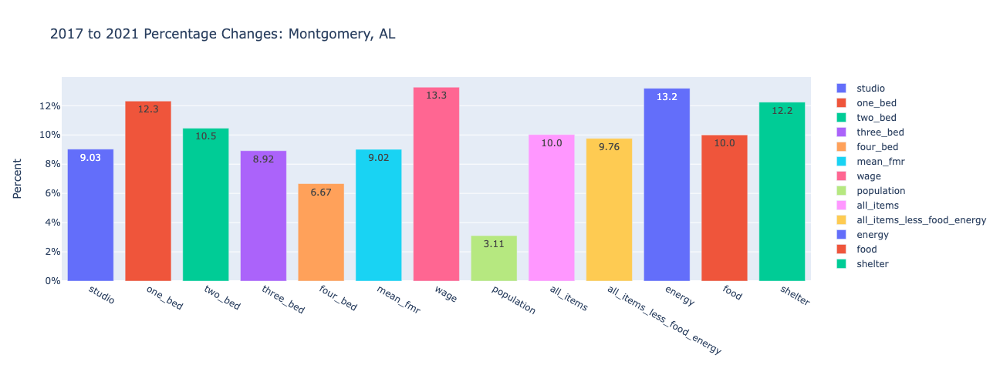

In [60]:
fig = px.bar(df_diff.query("metro_name == 'Montgomery, AL'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Montgomery, AL',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

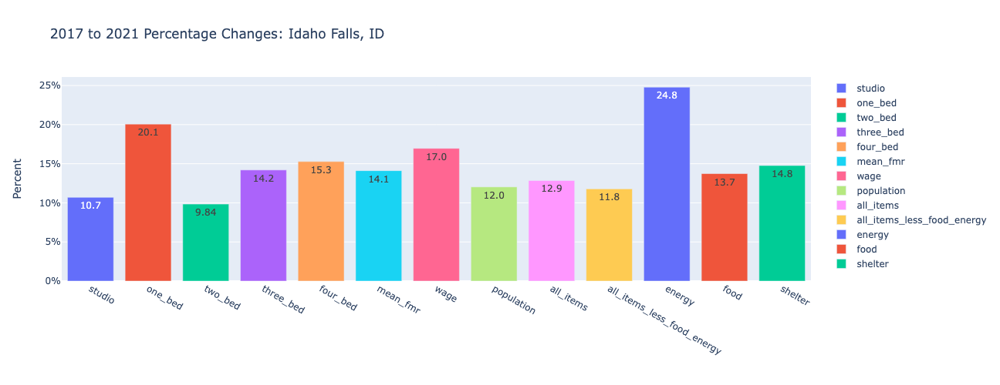

In [67]:
fig = px.bar(df_diff.query("metro_name == 'Idaho Falls, ID'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Idaho Falls, ID',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

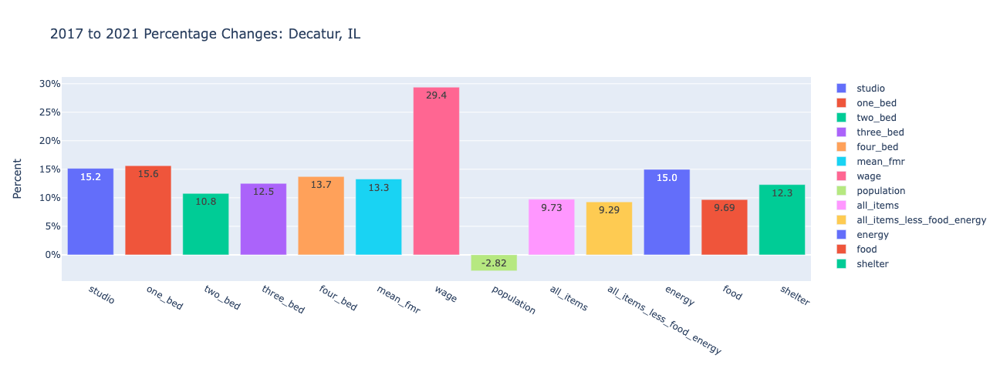

In [77]:
fig = px.bar(df_diff.query("metro_name == 'Decatur, IL'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Decatur, IL',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

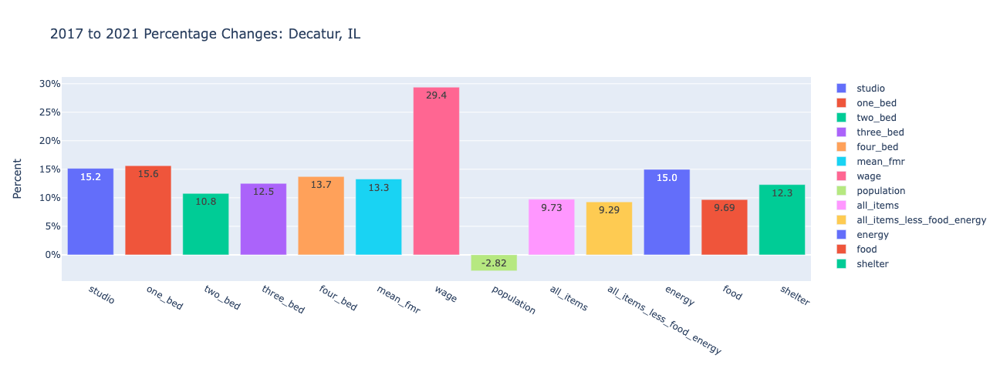

In [77]:
fig = px.bar(df_diff.query("metro_name == 'Decatur, IL'"),\
      x='type',\
      y='pct_change',\
      text_auto='.3s',\
      color='type',\
      height=500,
      title='2017 to 2021 Percentage Changes: Decatur, IL',
      labels={'pct_change':'Percent', 'type':''})

fig.update_yaxes(ticksuffix="%")

fig.show()

In [72]:
df_cb.query("cost_burdened == False & year == 2021 & state_alpha == 'IL'")[['state_alpha', 'metro_name']].reset_index()

,index,state_alpha,metro_name
0,1987,IL,"Cape Girardeau, MO-IL"
1,1989,IL,"Rockford, IL"
2,1990,IL,"St. Louis, MO-IL"
3,1992,IL,"Champaign-Urbana, IL"
4,1994,IL,"Davenport-Moline-Rock Island, IA-IL"
5,1997,IL,"Bloomington, IL"
6,1998,IL,"Decatur, IL"
7,1999,IL,"Peoria, IL"
8,2000,IL,"Springfield, IL"
9,2001,IL,"Danville, IL"


For each of the metro areas that we plotted, we can see that the fair market rents for a studio or one bedroom residence have the largest increase among the FMRs, and Energy consistently had the largest increase among the consumer price index increases.

Next we will begin to look at the relationships between variables using scatterplots, correlation heatmaps, and linear regression using Statsmodels.

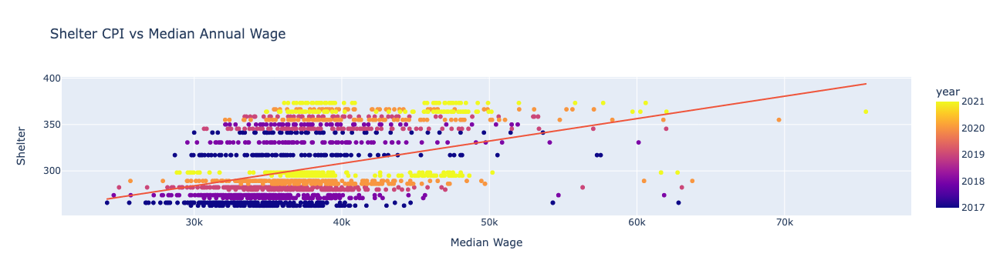

In [39]:
fig = px.scatter(df,
                 x='wage',
                 y='shelter', 
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'shelter', 'year', 'metro_name'],
                 title='Shelter CPI vs Median Annual Wage',
                 labels={'shelter':'Shelter', 'wage':'Median Wage'})
fig.show()

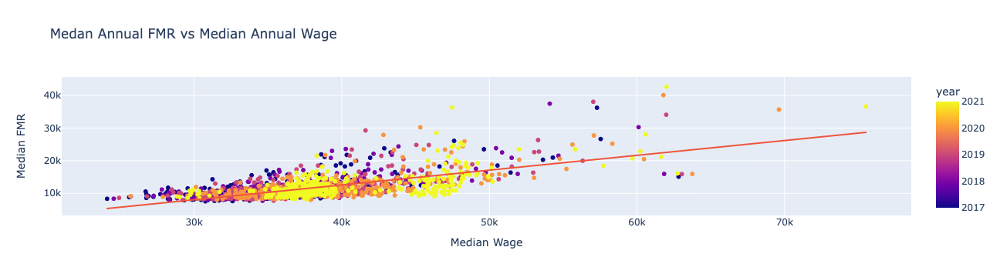

In [40]:
fig = px.scatter(df, 
                 x='wage',
                 y='two_bed',
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'mean_fmr', 'year', 'metro_name'],
                 labels={'two_bed':'Median FMR', 'wage':'Median Wage'},
                 title='Medan Annual FMR vs Median Annual Wage')
fig.show()

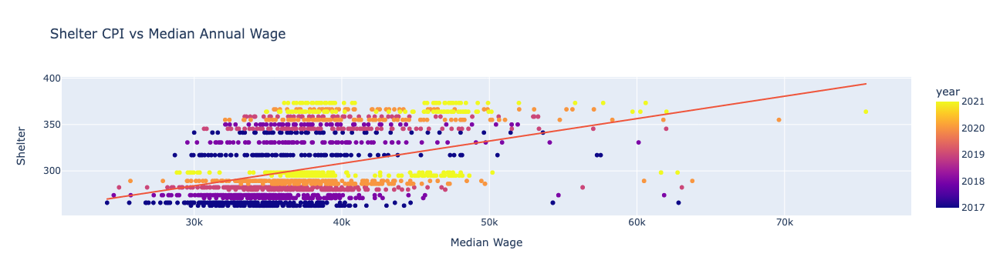

In [41]:
fig = px.scatter(df,
                 x='wage',
                 y='shelter', 
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'shelter', 'year', 'metro_name'],
                 title='Shelter CPI vs Median Annual Wage',
                 labels={'shelter':'Shelter', 'wage':'Median Wage'})
fig.show()

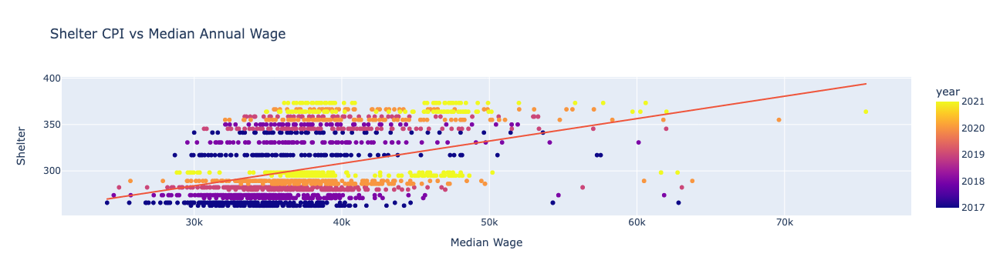

In [42]:
fig = px.scatter(df,
                 x='wage',
                 y='shelter', 
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'shelter', 'year', 'metro_name'],
                 title='Shelter CPI vs Median Annual Wage',
                 labels={'shelter':'Shelter', 'wage':'Median Wage'})
fig.show()

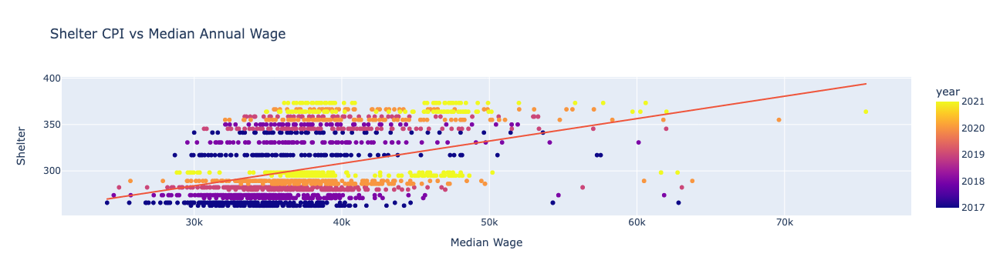

In [43]:
fig = px.scatter(df,
                 x='wage',
                 y='shelter', 
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'shelter', 'year', 'metro_name'],
                 title='Shelter CPI vs Median Annual Wage',
                 labels={'shelter':'Shelter', 'wage':'Median Wage'})
fig.show()

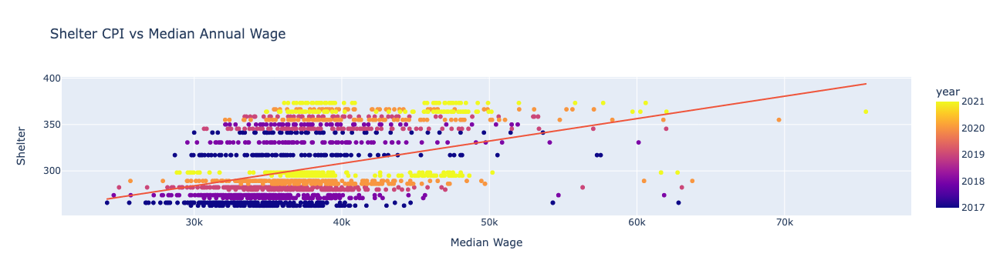

In [44]:
fig = px.scatter(df,
                 x='wage',
                 y='shelter', 
                 color='year',
                 trendline='ols',
                 hover_data=['wage', 'shelter', 'year', 'metro_name'],
                 title='Shelter CPI vs Median Annual Wage',
                 labels={'shelter':'Shelter', 'wage':'Median Wage'})
fig.show()

Now we will create correlation heatmaps for each of our four regions.

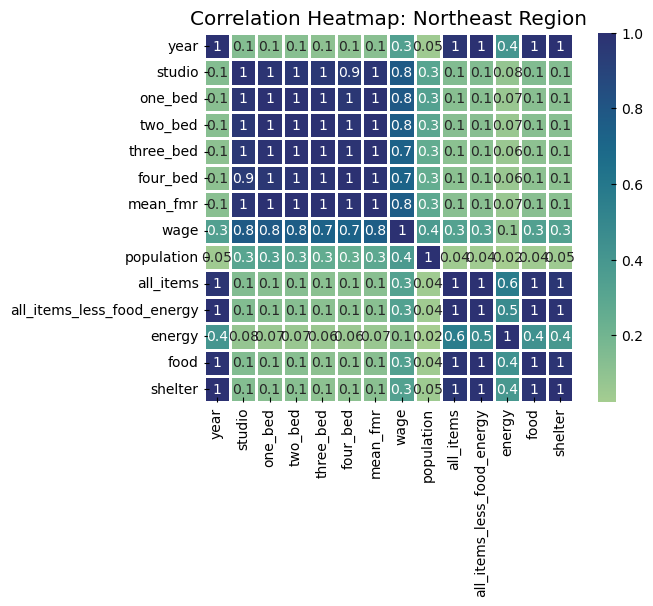

In [45]:
corr = df.query("region == 'Northeast'").corr()

ax = sns.heatmap(corr,cmap='crest',
                 annot=True,
                 fmt='.1g',
                 linewidth=1,
                 linecolor='w',
                 square=True)

ax.set(title = "Correlation Heatmap: Northeast Region")

plt.show()

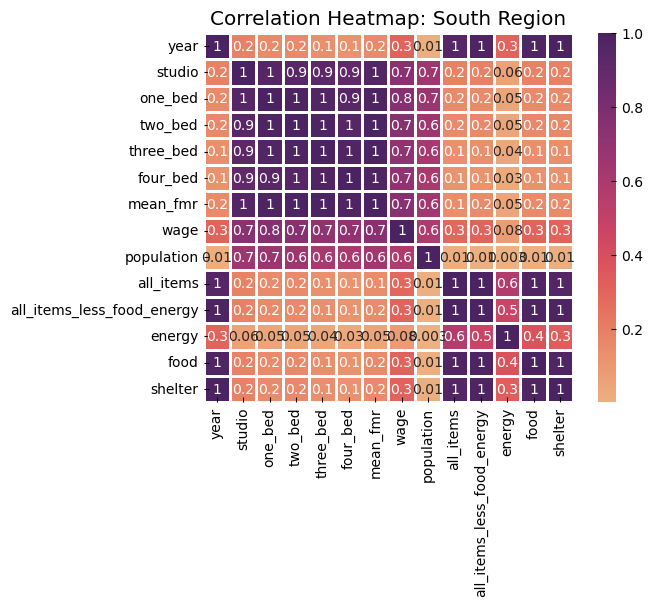

In [46]:
corr = df.query("region == 'South'").corr()

ax = sns.heatmap(corr,cmap='flare',
                 annot=True,
                 fmt='.1g',
                 linewidth=1,
                 linecolor='w',
                 square=True)

ax.set(title = "Correlation Heatmap: South Region")

plt.show()

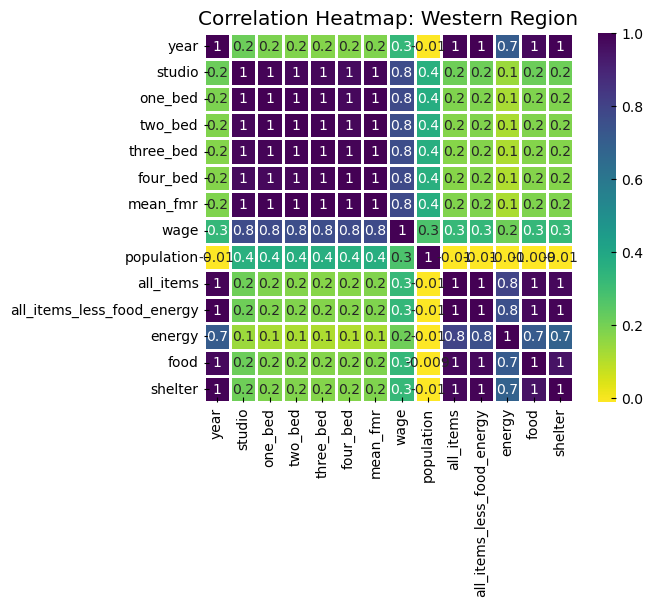

In [47]:
corr = df.query("region == 'West'").corr()

ax = sns.heatmap(corr,cmap='viridis_r',
                 annot=True,
                 fmt='.1g',
                 linewidth=1,
                 linecolor='w',
                 square=True)

ax.set(title = "Correlation Heatmap: Western Region")

plt.show()

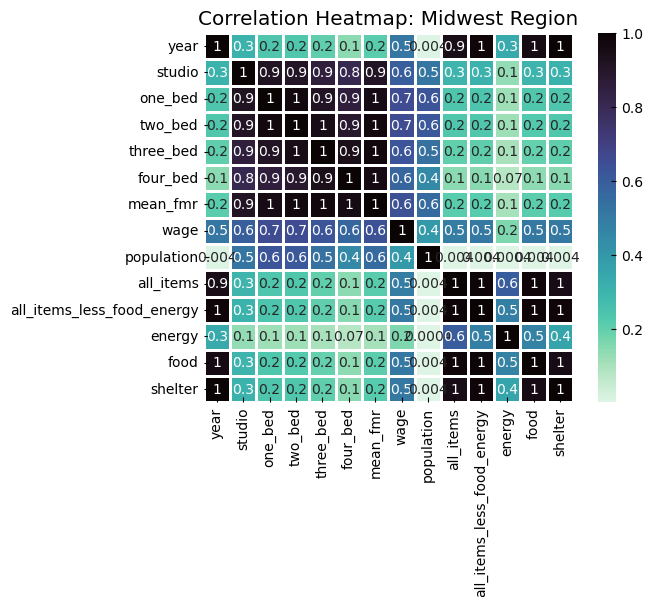

In [48]:
corr = df.query("region == 'Midwest'").corr()

ax = sns.heatmap(corr,cmap='mako_r',
                 annot=True,
                 fmt='.1g',
                 linewidth=1,
                 linecolor='w',
                 square=True)

ax.set(title = "Correlation Heatmap: Midwest Region")

plt.show()

Now we will use Statsmodels to perform simple linear regressions. For these models, we will assign wage as our dependent variable. Our scatterplots and correlation heatmaps showed wage had a higher correlation to the FMRs than it did to population or the CPIs. We can test this again by reviewing the OLS regression results.

In [86]:
formula1 = 'mean_fmr ~ population'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.164
Method:                 Least Squares   F-statistic:                     410.4
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           1.81e-83
Time:                        14:44:37   Log-Likelihood:                -20887.
No. Observations:                2095   AIC:                         4.178e+04
Df Residuals:                    2093   BIC:                         4.179e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3.658e+04    130.263    280.795      0.000    3.63e+04    3.68e+04
population     0.0019   9.17e-05     20.258      0.000       0.002       0.002
==============================================================================
Omnibus:                      564.318   Durbin-Watson:                   1.012
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2003.560
Skew:                           1.302   Prob(JB):                         0.00
Kurtosis:                       7.021   Cond. No.                     1.64e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.64e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [50]:
formula7 = 'wage ~ mean_fmr'
model7 = smf.ols(formula = formula7, data = df)
fitted7 = model7.fit()
fitted7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.481
Model:                            OLS   Adj. R-squared:                  0.480
Method:                 Least Squares   F-statistic:                     1937.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):          4.84e-300
Time:                        14:44:37   Log-Likelihood:                -20388.
No. Observations:                2095   AIC:                         4.078e+04
Df Residuals:                    2093   BIC:                         4.079e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.554e+04    294.326     86.790      0.000     2.5e+04    2.61e+04
mean_fmr       0.9783      0.022     44.006      0.000       0.935       1.022
==============================================================================
Omnibus:                      132.024   Durbin-Watson:                   1.051
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              256.202
Skew:                           0.439   Prob(JB):                     2.33e-56
Kurtosis:                       4.471   Cond. No.                     4.37e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.37e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [51]:
formula1 = 'wage ~ all_items'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.140
Method:                 Least Squares   F-statistic:                     342.0
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           7.58e-71
Time:                        14:44:38   Log-Likelihood:                -20916.
No. Observations:                2095   AIC:                         4.184e+04
Df Residuals:                    2093   BIC:                         4.185e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3083.2286   1885.559      1.635      0.102    -614.538    6780.996
all_items    137.7614      7.449     18.493      0.000     123.153     152.370
==============================================================================
Omnibus:                      599.738   Durbin-Watson:                   1.147
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2080.645
Skew:                           1.397   Prob(JB):                         0.00
Kurtosis:                       7.003   Cond. No.                     4.16e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.16e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [52]:
formula1 = 'wage ~ food'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.124
Method:                 Least Squares   F-statistic:                     298.0
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           1.56e-62
Time:                        14:44:38   Log-Likelihood:                -20935.
No. Observations:                2095   AIC:                         4.187e+04
Df Residuals:                    2093   BIC:                         4.188e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -4512.9803   2459.010     -1.835      0.067   -9335.340     309.379
food         163.1958      9.454     17.263      0.000     144.656     181.735
==============================================================================
Omnibus:                      581.576   Durbin-Watson:                   1.133
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1913.237
Skew:                           1.373   Prob(JB):                         0.00
Kurtosis:                       6.791   Cond. No.                     5.53e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.53e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [53]:
formula1 = 'wage ~ shelter'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.157
Method:                 Least Squares   F-statistic:                     390.7
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           7.20e-80
Time:                        14:44:38   Log-Likelihood:                -20895.
No. Observations:                2095   AIC:                         4.179e+04
Df Residuals:                    2093   BIC:                         4.181e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.815e+04   1005.315     18.049      0.000    1.62e+04    2.01e+04
shelter       65.1624      3.297     19.766      0.000      58.697      71.628
==============================================================================
Omnibus:                      648.205   Durbin-Watson:                   1.164
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2558.714
Skew:                           1.466   Prob(JB):                         0.00
Kurtosis:                       7.551   Cond. No.                     2.70e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.7e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [54]:
formula1 = 'wage ~ energy'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.068
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     152.7
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           6.53e-34
Time:                        14:44:38   Log-Likelihood:                -21000.
No. Observations:                2095   AIC:                         4.200e+04
Df Residuals:                    2093   BIC:                         4.202e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.712e+04    879.595     30.832      0.000    2.54e+04    2.88e+04
energy        50.0655      4.051     12.358      0.000      42.120      58.011
==============================================================================
Omnibus:                      614.658   Durbin-Watson:                   1.068
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2111.327
Skew:                           1.438   Prob(JB):                         0.00
Kurtosis:                       6.989   Cond. No.                     1.60e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.6e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Based on the above regression summaries, we can see that the mean FMR explains a larger percentage of the variance in the wage than can be explained by the other independent variables. Additionally, the P-values for the intercepts of the Food and All Items CPIs are greater than 0.05, indicating that they may not have a statistically significant relationship to the median wage.

Now we will perform multiple regressions.

### Multiple Regression 

In [55]:
formula1 = 'wage ~ shelter + food'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.163
Method:                 Least Squares   F-statistic:                     205.5
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           3.17e-82
Time:                        14:44:38   Log-Likelihood:                -20886.
No. Observations:                2095   AIC:                         4.178e+04
Df Residuals:                    2092   BIC:                         4.180e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   7708.2845   2698.673      2.856      0.004    2415.920     1.3e+04
shelter       49.5738      4.979      9.956      0.000      39.809      59.339
food          58.3478     14.010      4.165      0.000      30.873      85.823
==============================================================================
Omnibus:                      632.915   Durbin-Watson:                   1.176
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2387.885
Skew:                           1.446   Prob(JB):                         0.00
Kurtosis:                       7.358   Cond. No.                     9.56e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.56e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [56]:
formula1 = 'wage ~ shelter + food + energy'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.163
Method:                 Least Squares   F-statistic:                     137.4
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           3.11e-81
Time:                        14:44:38   Log-Likelihood:                -20886.
No. Observations:                2095   AIC:                         4.178e+04
Df Residuals:                    2091   BIC:                         4.180e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   7569.1796   2702.216      2.801      0.005    2269.867    1.29e+04
shelter       52.0790      5.569      9.352      0.000      41.158      63.000
food          60.3200     14.147      4.264      0.000      32.577      88.063
energy        -5.2644      5.239     -1.005      0.315     -15.539       5.010
==============================================================================
Omnibus:                      634.144   Durbin-Watson:                   1.176
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2398.727
Skew:                           1.448   Prob(JB):                         0.00
Kurtosis:                       7.369   Cond. No.                     1.09e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.09e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [57]:
formula1 = 'wage ~ shelter + food + energy + all_items_less_food_energy'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.186
Model:                            OLS   Adj. R-squared:                  0.184
Method:                 Least Squares   F-statistic:                     119.1
Date:                Mon, 24 Apr 2023   Prob (F-statistic):           1.16e-91
Time:                        14:44:38   Log-Likelihood:                -20859.
No. Observations:                2095   AIC:                         4.173e+04
Df Residuals:                    2090   BIC:                         4.176e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                    2.65e+04   3708.589      7.146      0.000    1.92e+04    3.38e+04
shelter                      217.9083     23.217      9.386      0.000     172.377     263.440
food                         300.7934     35.569      8.457      0.000     231.040     370.547
energy                       -21.4742      5.624     -3.818      0.000     -32.504     -10.445
all_items_less_food_energy  -494.8237     67.308     -7.352      0.000    -626.821    -362.827
==============================================================================
Omnibus:                      676.343   Durbin-Watson:                   1.209
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2809.266
Skew:                           1.516   Prob(JB):                         0.00
Kurtosis:                       7.795   Cond. No.                     1.74e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.74e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [84]:
formula1 = 'wage ~ shelter + food + energy + all_items_less_food_energy + population + two_bed + year'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     478.2
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        15:14:33   Log-Likelihood:                -20072.
No. Observations:                2095   AIC:                         4.016e+04
Df Residuals:                    2087   BIC:                         4.020e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                  -4.155e+06   2.22e+05    -18.702      0.000   -4.59e+06   -3.72e+06
shelter                      129.3404     16.272      7.949      0.000      97.429     161.252
food                        -139.4517     33.154     -4.206      0.000    -204.469     -74.434
energy                        -4.2013      4.131     -1.017      0.309     -12.302       3.900
all_items_less_food_energy  -221.5539     48.410     -4.577      0.000    -316.490    -126.618
population                     0.0008   6.93e-05     11.020      0.000       0.001       0.001
two_bed                        0.9229      0.026     35.471      0.000       0.872       0.974
year                        2098.5421    111.362     18.844      0.000    1880.150    2316.934
==============================================================================
Omnibus:                      403.631   Durbin-Watson:                   1.409
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2221.636
Skew:                           0.793   Prob(JB):                         0.00
Kurtosis:                       7.789   Cond. No.                     4.11e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.11e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [84]:
formula1 = 'wage ~ shelter + food + energy + all_items_less_food_energy + population + two_bed + year'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     478.2
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        15:14:33   Log-Likelihood:                -20072.
No. Observations:                2095   AIC:                         4.016e+04
Df Residuals:                    2087   BIC:                         4.020e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                  -4.155e+06   2.22e+05    -18.702      0.000   -4.59e+06   -3.72e+06
shelter                      129.3404     16.272      7.949      0.000      97.429     161.252
food                        -139.4517     33.154     -4.206      0.000    -204.469     -74.434
energy                        -4.2013      4.131     -1.017      0.309     -12.302       3.900
all_items_less_food_energy  -221.5539     48.410     -4.577      0.000    -316.490    -126.618
population                     0.0008   6.93e-05     11.020      0.000       0.001       0.001
two_bed                        0.9229      0.026     35.471      0.000       0.872       0.974
year                        2098.5421    111.362     18.844      0.000    1880.150    2316.934
==============================================================================
Omnibus:                      403.631   Durbin-Watson:                   1.409
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2221.636
Skew:                           0.793   Prob(JB):                         0.00
Kurtosis:                       7.789   Cond. No.                     4.11e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.11e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [84]:
formula1 = 'wage ~ shelter + food + energy + all_items_less_food_energy + population + two_bed + year'
model1 = smf.ols(formula = formula1, data = df)
fitted1 = model1.fit()
fitted1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     478.2
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        15:14:33   Log-Likelihood:                -20072.
No. Observations:                2095   AIC:                         4.016e+04
Df Residuals:                    2087   BIC:                         4.020e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                  -4.155e+06   2.22e+05    -18.702      0.000   -4.59e+06   -3.72e+06
shelter                      129.3404     16.272      7.949      0.000      97.429     161.252
food                        -139.4517     33.154     -4.206      0.000    -204.469     -74.434
energy                        -4.2013      4.131     -1.017      0.309     -12.302       3.900
all_items_less_food_energy  -221.5539     48.410     -4.577      0.000    -316.490    -126.618
population                     0.0008   6.93e-05     11.020      0.000       0.001       0.001
two_bed                        0.9229      0.026     35.471      0.000       0.872       0.974
year                        2098.5421    111.362     18.844      0.000    1880.150    2316.934
==============================================================================
Omnibus:                      403.631   Durbin-Watson:                   1.409
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2221.636
Skew:                           0.793   Prob(JB):                         0.00
Kurtosis:                       7.789   Cond. No.                     4.11e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.11e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Insights

**1. Have the percentage increases in median wages kept up with the percentage increases in rent and CPI?**

In short, it depends on the area. For some areas that we plotted, like Fort Lauderdale, FL or San Francisco, CA, we can see that the median wage increase is well below the increases of the FMRs and consumer price indexes. Other areas like Decatur, IL and Rochester, NY have seen greater increases in the median wage. A point to consider however, is that the Fair Market Rent data provided by HUD may differ from actual market rent data that can be found directly on property listings in some cities. 

**2. Is there a correlation between wages and other variables like rent, CPI, and population?**

There appears to be a correlation between wages and the other variables, but the strongest correlation is between wages and fair market rents.

**3. Can we conclude that an increase in an area's population directly relates to an increase in living expenses based on our collected data?**

Again, it depends largely on the area. In some areas, like those in the southern region, we see a higher correlation between the median FMR and population. In other areas population seems to have little to no effect on living expenses.